In [17]:
using Pkg
Pkg.instantiate()

Precompiling project...
  ✓ ColonyImages
  1 dependency successfully precompiled in 27 seconds. 366 already precompiled.
  1 dependency precompiled but a different version is currently loaded. Restart julia to access the new version


In [18]:
using Revise, CairoMakie
using ColonyImages
using DataFrames, CSV, FileIO, Dates
import ColorSchemes as co 

# 1.Create Eden Model schematic

### 1.1 Set Parameters

In [19]:
para = parameters(im_size= [800,800], time_points =[0,36.0,72, 108]);
Points= lattice_points(Int(maximum(para.im_size)÷2));

### 1.2 Create spherical  starting colony 

In [20]:
colony = BitArray(zeros(Bool, para.im_size...,para.stacks))
build_artifical_colony!(para.Center,(@view colony[:,:,1]),para.radius_colony,Points)
pixel_to_add_vec = para.pixel_to_add(colony[:,:,1])

Names = ["A: Random","B: Finger_weak","C: Finger_Strong"]

3-element Vector{String}:
 "A: Random"
 "B: Finger_weak"
 "C: Finger_Strong"

### 1.3 Randomly expand spherical starting colony 

In [21]:
for j in 2:para.stacks
    # use view to work on array directly 
    int_img  = @view colony[:,:,j]
    #assign previous colony to current colony
    int_img[:] = colony[:,:,j-1]
    expand_colony_radom_cov!(int_img,pixel_to_add_vec[j-1])
end

### 1.3.1  Make Plot

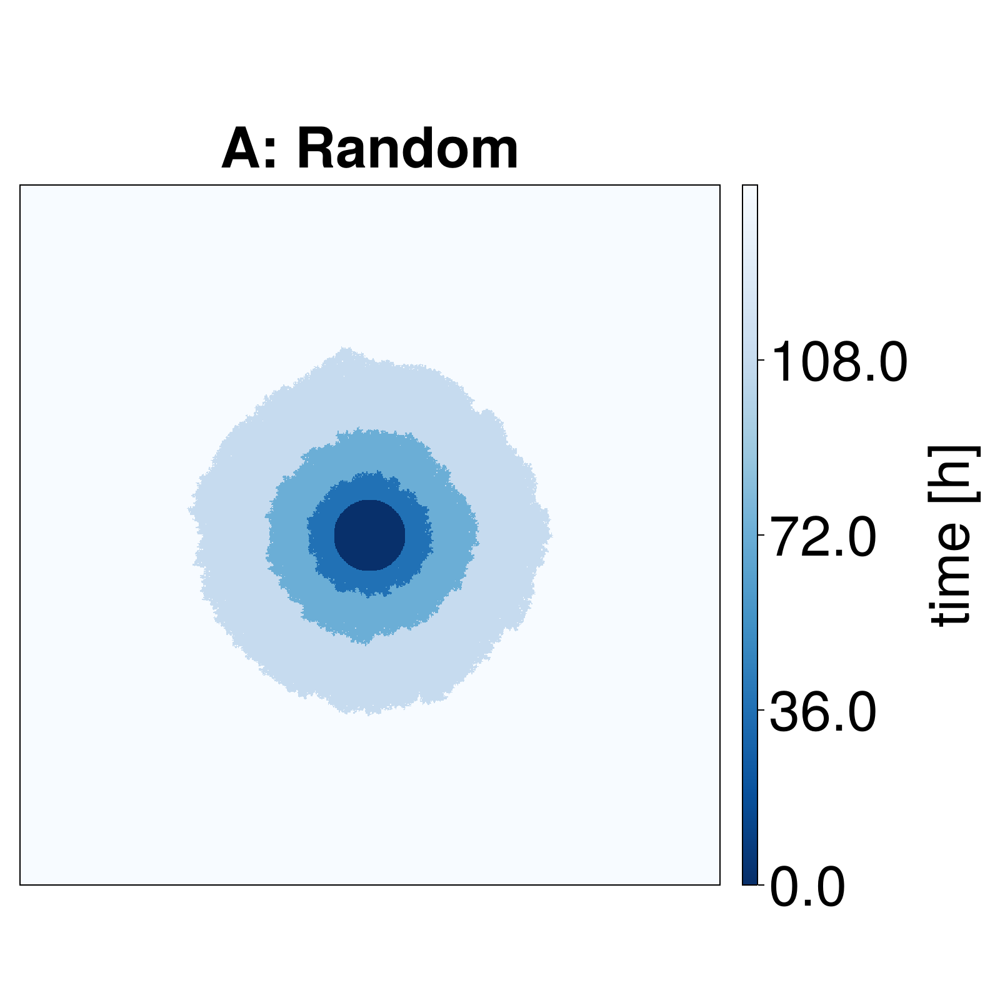

In [22]:
fontsize_theme = Theme(fontsize = 45)
update_theme!(fontsize_theme)
plot_timeseries_heatmap(colony,para, name = Names[1])

### 1.4 Finger like expansion 

In [23]:
dir_vec = generate_dir_vec(para)
for j in 2:para.stacks
    # use view to work on array directly 
    int_img  = @view colony[:,:,j]
    #assign previous colony to current colony
    int_img[:] = colony[:,:,j-1]
    expand_colony_finger_radom_cov!(int_img,pixel_to_add_vec[j-1],dir_vec,still_spawn_rate= 0.2,dir_match_rate= 0.998)
end

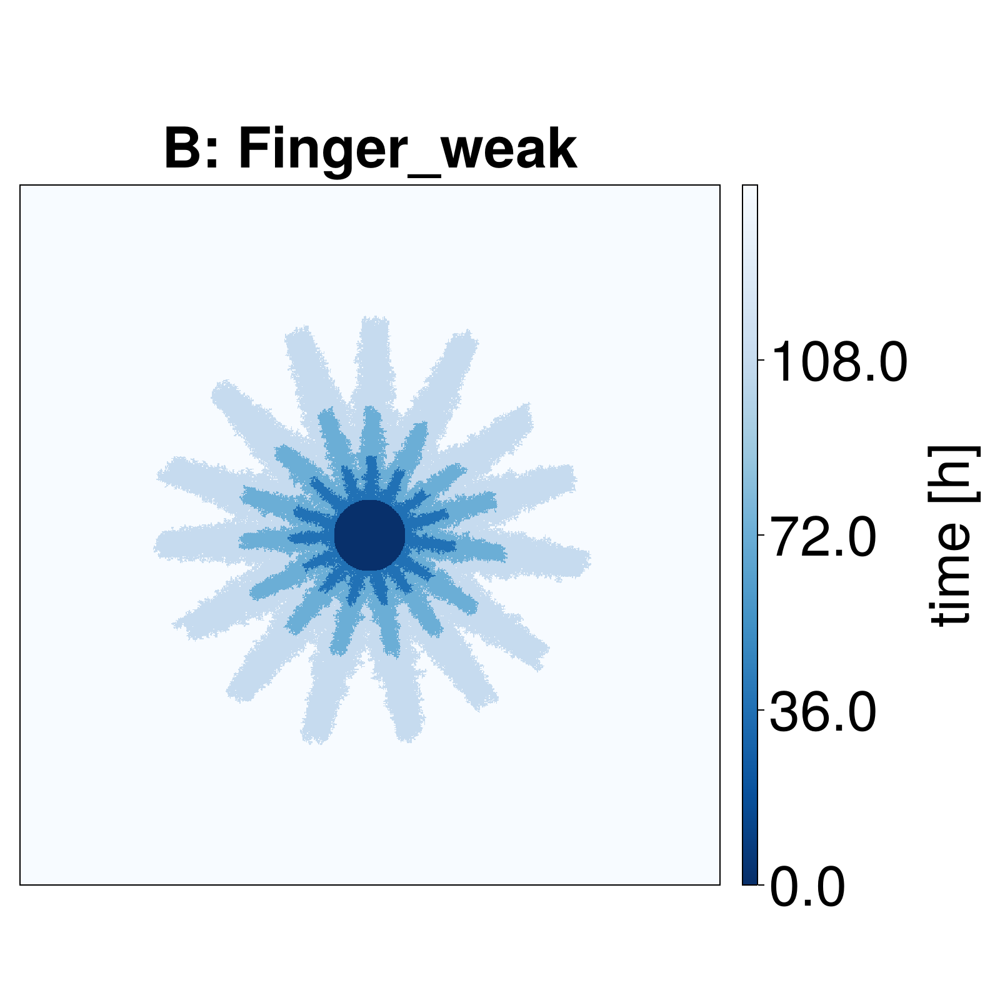

In [24]:
plot_timeseries_heatmap(colony,para, name = Names[2])

In [25]:
dir_vec = generate_dir_vec(para)
for j in 2:para.stacks
    # use view to work on array directly 
    int_img  = @view colony[:,:,j]
    #assign previous colony to current colony
    int_img[:] = colony[:,:,j-1]
    expand_colony_finger_radom_cov!(int_img,pixel_to_add_vec[j-1],dir_vec, still_spawn_rate= 0.0,dir_match_rate= 0.998)
end


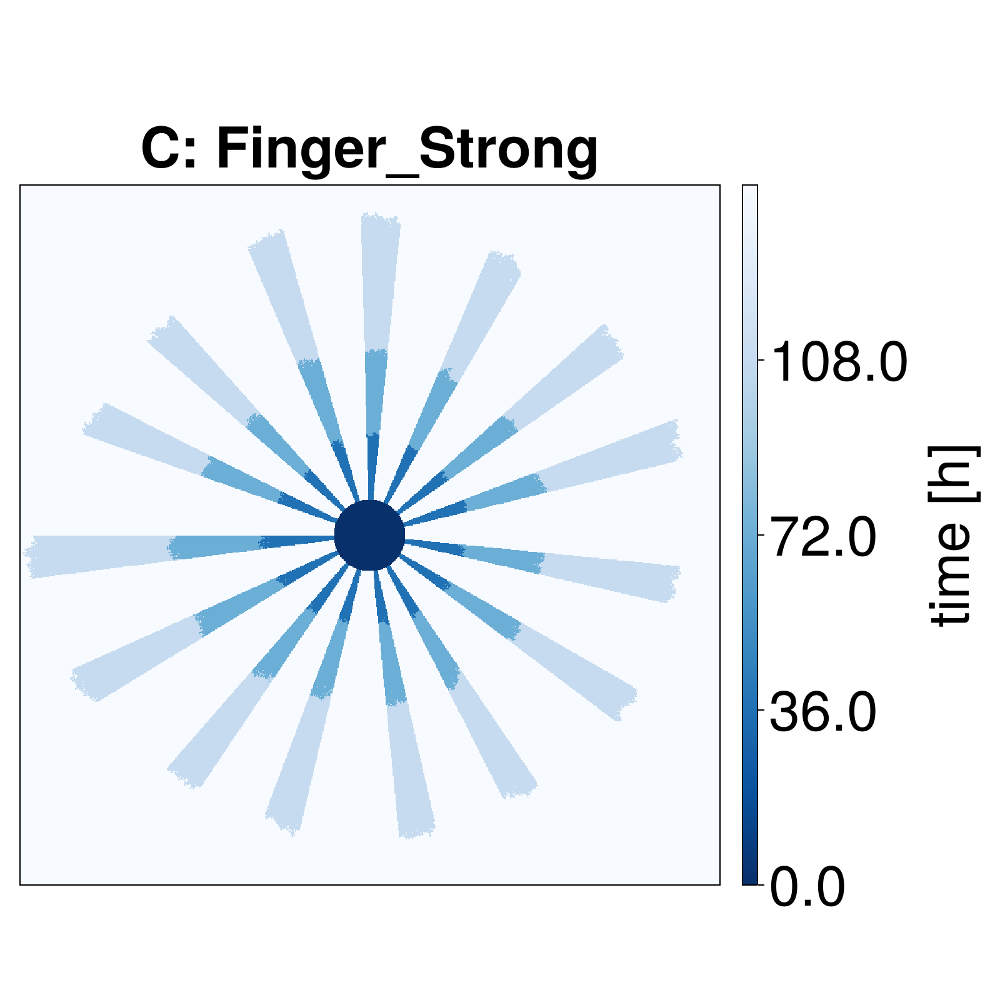

In [26]:
plot_timeseries_heatmap(colony,para, name = Names[3])

# 2. Make convolution Schematic

### 2.1 Create empty colony

In [49]:
para = parameters(
    time_points = Float64[0,24,48,72,96,120],
    im_size = [10,10],   
);

In [51]:
colony  =BitArray(zeros(Bool, para.im_size...,para.stacks))
colony_cov =zeros(Float64, para.im_size...,para.stacks)
build_artifical_colony!(para.Center,(@view colony[:,:,1]),para.radius_colony,Points)
pixel_to_add_vec = para.pixel_to_add(colony[:,:,1]);

In [52]:
begin 
    @label loop_try_as_long_until_it_works
    try 
        for j in 2:para.stacks
            # use view to work on array directly 
            int_img  = @view colony[:,:,j]
            #assign previous colony to current colony
            int_img[:] = colony[:,:,j-1]
            colony_cov[:,:,j] = expand_colony_radom_cov_show!(int_img,pixel_to_add_vec[j-1])
        end
    catch
        print("f ")
        @goto loop_try_as_long_until_it_works
    end   
end

f f f f f f f f f f f f f f f f f f f f f f f f f f f f f f f f f f f f f f f f f f f f f f f f f f f f f f 

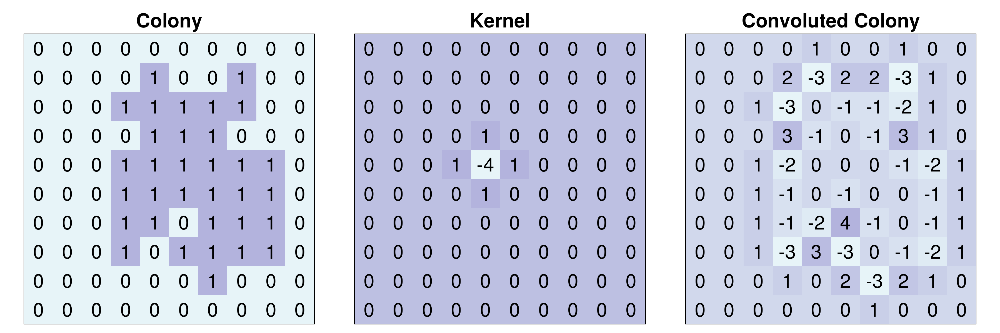

In [53]:
plot_convolution_schematic3(colony, colony_cov, para)

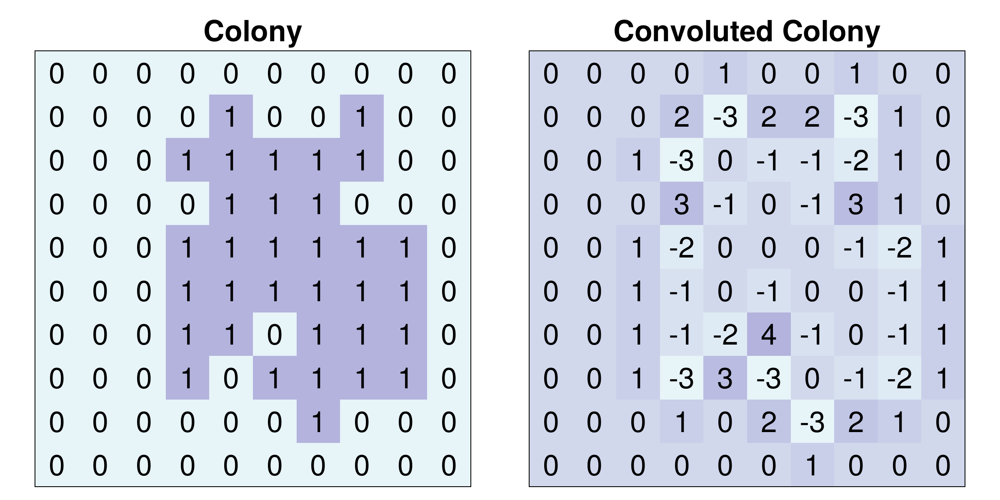

In [54]:
plot_convolution_schematic2(colony, colony_cov, para, name = "cov_fig1")

In [55]:
border_points = (findall(colony_cov[:,:,end] .> 0.1))
for i in 1:length(border_points)
    println(i, " ", border_points[i])
end

1 CartesianIndex(7, 1)
2 CartesianIndex(4, 2)
3 CartesianIndex(6, 2)
4 CartesianIndex(8, 2)
5 CartesianIndex(9, 2)
6 CartesianIndex(3, 3)
7 CartesianIndex(5, 3)
8 CartesianIndex(10, 3)
9 CartesianIndex(3, 4)
10 CartesianIndex(6, 4)
11 CartesianIndex(10, 4)
12 CartesianIndex(3, 5)
13 CartesianIndex(10, 5)
14 CartesianIndex(3, 6)
15 CartesianIndex(10, 6)
16 CartesianIndex(4, 7)
17 CartesianIndex(8, 7)
18 CartesianIndex(9, 7)
19 CartesianIndex(3, 8)
20 CartesianIndex(9, 8)
21 CartesianIndex(4, 9)
22 CartesianIndex(6, 9)
23 CartesianIndex(7, 9)
24 CartesianIndex(9, 9)
25 CartesianIndex(5, 10)
26 CartesianIndex(8, 10)


In [56]:
point = border_points[11]
expand_colony_point!(colony[:,:,end], colony_cov[:,:,end], point);

cov_add = zeros(Int, para.im_size...)
data_add = zeros(Int, para.im_size...)

cov_add[point[1]-1:point[1]+1,point[2]-1:point[2]+1] += para.laplac_kernel
data_add[point] += 1

plot_convolution_schematic2(data_add, cov_add, para, name ="added_point")

BoundsError: BoundsError: attempt to access 10×10 Matrix{Float64} at index [9:11, 3:5]

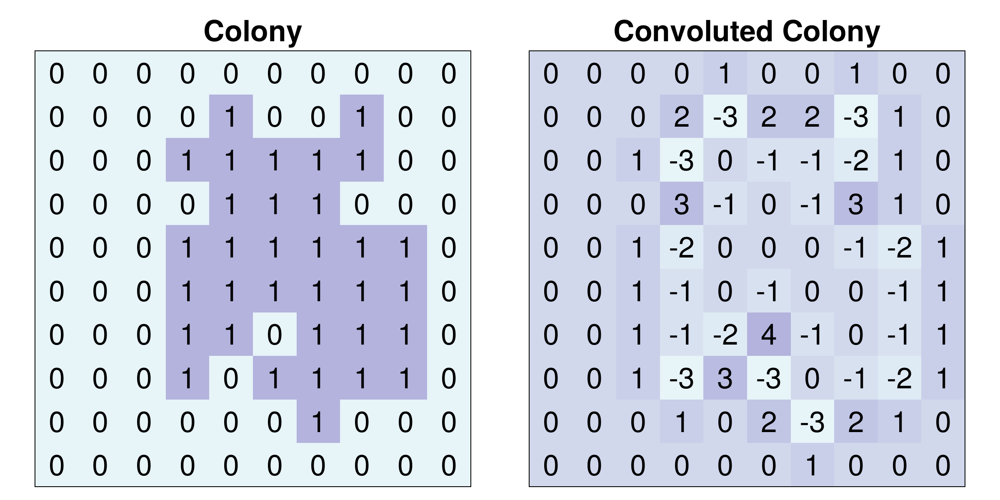

In [57]:
plot_convolution_schematic2(colony, colony_cov, para, name ="cov_fig2")

# 3. Show all colonies

In [77]:
para = parameters(
    time_points = Float64[0,24,48,72,96,120],
    im_size = [1000,1000],
    plot_factor = 2,
    kernel_ratio = 0.1,
);

In [78]:
img_int_vec_2 = Vector{BitArray{3}}(undef, 0)
for i in 1:para.colony_nr
    hans =BitArray(zeros(Bool, para.im_size...,para.stacks))
    push!(img_int_vec_2, hans)
end

In [79]:
for (i,colony) in enumerate(img_int_vec_2)
    for (j,t) in enumerate(para.time_points)
        # use view to work on array directly 
        int_img  = @view colony[:,:,j]
        if j == 1
            build_artifical_colony!(para.Center,int_img,para.radius_colony,Points)
            pixel_to_add_vec = para.pixel_to_add(int_img)
        else
            # for unkown reason views require [:] to make assignments 
            int_img[:] = colony[:,:,j-1]
            expand_colony_radom_cov!(int_img,pixel_to_add_vec[j-1])
        end
    end   
end

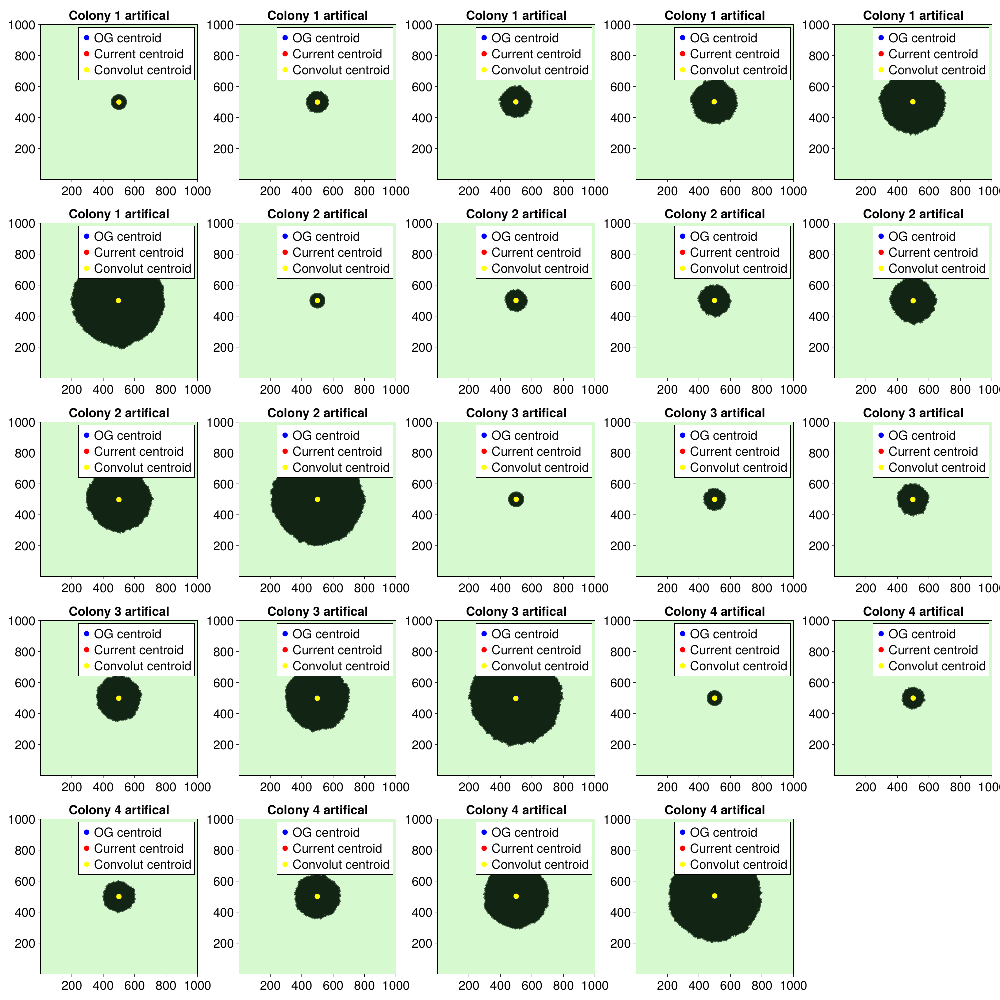

In [80]:
fontsize_theme = Theme(fontsize = 25)
update_theme!(fontsize_theme)
fig_big = plot_time_series_cov_centroid(img_int_vec_2, para)
fig_big

In [81]:
para = parameters(
    time_points = Float64[0,24,48,72,96,120],
    im_size = [1000,1000],
    plot_factor = 2
);
fontsize_theme = Theme(fontsize = 15)
update_theme!(fontsize_theme)

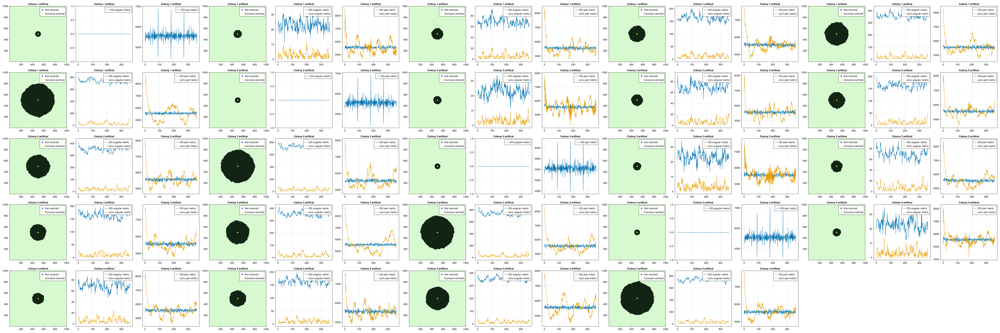

In [83]:
fig_metric = plot_time_series_metrics(img_int_vec_2, para,Points)

### 4. Show angular metric schematic dividing the image into circular sectors

In [84]:
df = DataFrame_Colony()
image_data = "data\\image_data_stacked\\"
for (i,x) in enumerate(readdir(image_data))
    println(i,"  ",x)
end

1  10_04_23_stacked_half_res
2  14_06_23_stacked_full_res
3  14_06_23_stacked_half_res
4  17_05_23_stacked_full_res
5  17_05_23_stacked_half_res
6  19_12_22_stacked_full_res
7  26_06_23_stacked_full_res
8  27_04_22_stacked_full_res_expo
9  27_04_22_stacked_half_res_expo
10  28_03_23_stacked_half_res


In [85]:
data_set = "26_06_23_stacked_full_res"
path = joinpath(image_data, data_set)
readdir(path)
time_points = CSV.read(joinpath(path,"timepoints.csv"), DataFrame).time

6-element Vector{Float64}:
  0.0
  3.0
 19.0
 24.0
 43.0
 48.0

In [87]:
colonies = filter(x->x[end-2:end]=="tif",readdir(path))
img_vec  = load.(joinpath.(path, colonies));
img_int_vec = b_w.(img_vec);

Loading: 100%|███████████████████████████████████████████| Time: 0:00:00


In [88]:
para = parameters(
        im_size = [size(img_int_vec[1])[1:2]...],
        time_points = time_points,
        colony_nr = length(img_int_vec),
        colonies = colonies,
        threshold_conv = 0.8);

Points= lattice_points(Int(maximum(para.im_size)÷2));

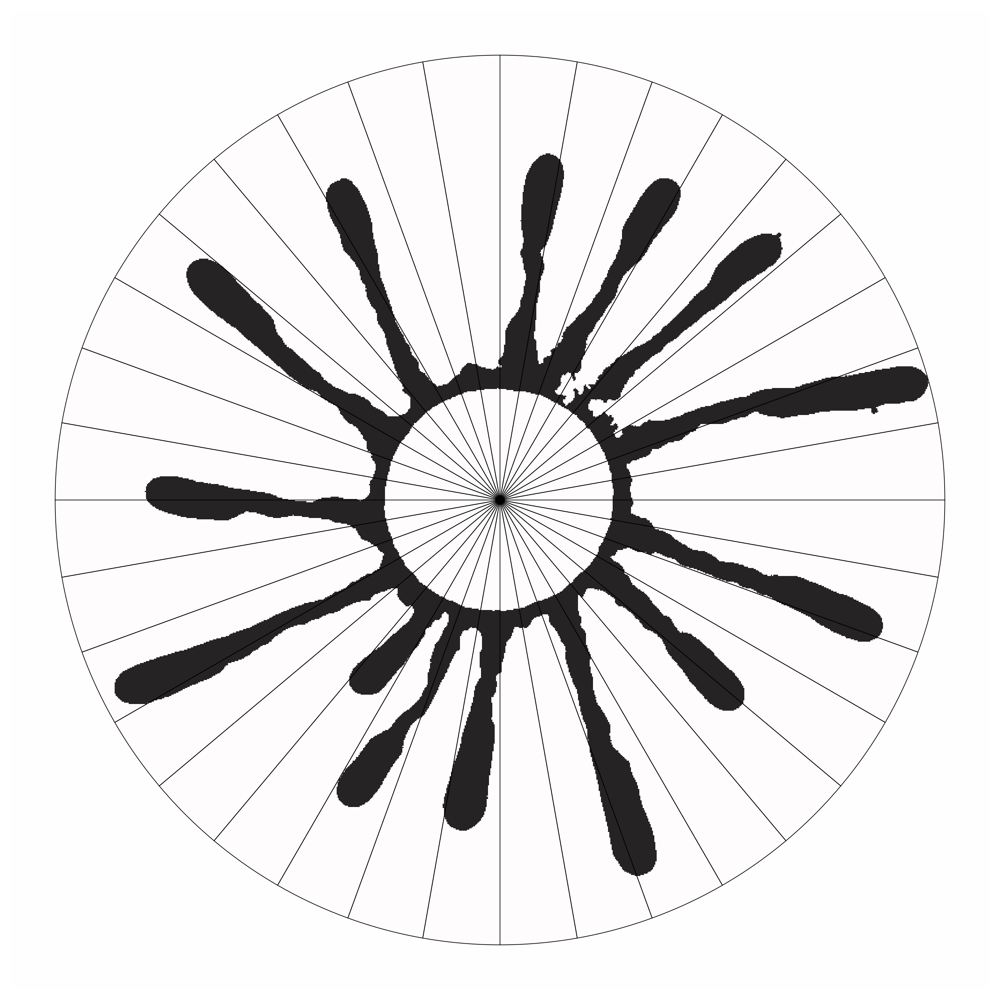

In [89]:
fig_89 = Figure(size =(1500,round(Int,1500)))
int_img = img_int_vec[7][:,:,1]
y1,x1 = centroid(int_img)
kernel = create_kernel(round(Int64,approx_radi_colo(int_img)*para.kernel_ratio), geometry = "square")
nneigh = sum(kernel)

int_img = img_int_vec[2][:,:,6]
#int_img = hcat(int_img[1:end-18,70:end],zeros(Int,1812-18,24))
#int_img = expand_matrix(int_img, annuli= 70)
int_img = rotr90(int_img)
x = 420
y_o = 150
x_o = -3


int_img = int_img[(x-x_o):end-(x+x_o),(x-y_o):end-(x+y_o) ]
int_fac = round(Int,(1-0.8705035971223022)*size(int_img)[1]/2)

int_img = int_img[:,int_fac: end-int_fac]
out = conv( int_img, kernel ) ./ nneigh
y_c, x_c = centroid(out .> para.threshold_conv)
y,x = centroid(int_img)
ax = CairoMakie.Axis(fig_89[1,1])
ax2 = CairoMakie.Axis(fig_89[1,1])
hidedecorations!(ax2)
hidedecorations!(ax)

hidespines!(ax)
hidespines!(ax2)

circle_kernel = build_circle([y_c, x_c],int_img,Points,threshold = 0.8)
#heatmap!(ax,int_img,colormap = (:hawaii,1.0))
#heatmap!(ax,out .> threshold_conv, colormap  =(:algae, 0.2))
#heatmap!(ax,circle_kernel, colormap  =(:thermal, 0.5))

int_img_1 = img_int_vec[2][:,:,1]
#int_img = hcat(int_img[1:end-18,70:end],zeros(Int,1812-18,24))
#int_img = expand_matrix(int_img, annuli= 70)
int_img_1 = rotr90(int_img_1)
x = 420
y_o = 150
x_o = -3
int_img_1 = int_img_1[(x-x_o):end-(x+x_o),(x-y_o):end-(x+y_o) ]

int_fac = round(Int,(1-0.8705035971223022)*size(int_img_1)[1]/2)

int_img_1 = int_img_1[:,int_fac: end-int_fac]

#heatmap!(ax,int_img,colormap = (:grayC10,1.0))

heatmap!(ax,(int_img.-int_img_1).*-1,colormap = (:grayC10,1.0))
#heatmap!(ax,int_img_1, colormap  =(:thermal, 0.5))
#scatter!(ax,y1,x1, color = :blue, markersize = 15, label = "Centroid first Timestep")

#scatter!(ax,y,x, color = :red, markersize = 15, label = "Centroid")
#scatter!(ax,y_c, x_c, color = :black, markersize = 45, label = "Centroid")
pie_data = [1 for i in 1:10:360]
pie!(ax2,pie_data,radius = 10, color = (:red, 0.01))
#axislegend(ax)
fig_89

In [93]:
fig_big = Figure(size = res_scaling(img_int_vec, factor =3))

c = 0 
for (i,img_stack) in enumerate(img_int_vec)
    int_img = img_stack[:,:,1]
    y1,x1 = centroid(int_img)
    kernel = create_kernel(round(Int64,approx_radi_colo(int_img)*para.kernel_ratio), geometry = "square")
    nneigh = sum(kernel)
    
    for z in 1:size(img_stack,3)
        int_img = img_stack[:,:,z]
        out = conv( int_img, kernel ) ./ nneigh
        y_c, x_c = centroid(out .> para.threshold_conv)
        y,x = centroid(int_img)
        ax = CairoMakie.Axis(fig_big[c÷5+1,c%5+1], title = colonies[i])
        #hidedecorations!(ax)
        circle_kernel = build_circle([y,x],int_img,Points,threshold = 0.8)
        heatmap!(ax,int_img,colormap = :algae)
        #heatmap!(ax,out .> threshold_conv, colormap  =(:algae, 0.2))
        heatmap!(ax,circle_kernel, colormap  =(:thermal, 0.5))
        #scatter!(ax,y1,x1, color = :blue, markersize = 15, label = "Centroid first Timestep")
        
        scatter!(ax,y,x, color = :red, markersize = 15, label = "Centroid")
        #scatter!(ax,y_c, x_c, color = :yellow, markersize = 15, label = "Centroid convoluted")
        axislegend(ax)
        c += 1
            
    end

end

#save(joinpath(path,"methos_compare_centroid.png"), fig_big)

fig_big

In [94]:
fig_big = Figure(resolution = res_scaling(img_int_vec, factor =3))

c = 0 
for (i,img_stack) in enumerate(img_int_vec)
    int_img = img_stack[:,:,1]
    y1,x1 = centroid(int_img)
    kernel = create_kernel(round(Int64,approx_radi_colo(int_img)*para.kernel_ratio), geometry = "square")
    nneigh = sum(kernel)
    
    for z in 1:size(img_stack,3)
        int_img = img_stack[:,:,z]
        out = conv( int_img, kernel ) ./ nneigh
        y_c, x_c = centroid(out .> para.threshold_conv)
        y,x = centroid(int_img)
        ax = CairoMakie.Axis(fig_big[c÷5+1,c%5+1], title = colonies[i])
        #hidedecorations!(ax)
        circle_kernel = build_circle([y_c, x_c],int_img,Points,threshold = 0.8)
        heatmap!(ax,int_img,colormap = :algae)
        #heatmap!(ax,out .> threshold_conv, colormap  =(:algae, 0.2))
        heatmap!(ax,circle_kernel, colormap  =(:thermal, 0.5))
        #scatter!(ax,y1,x1, color = :blue, markersize = 15, label = "Centroid first Timestep")
        
        scatter!(ax,y,x, color = :red, markersize = 15, label = "Centroid")
        scatter!(ax,y_c, x_c, color = :yellow, markersize = 15, label = "Centroid convoluted")
        axislegend(ax)
        c += 1
            
    end

end

#save(joinpath(path,"methos_compare_cov.png"), fig_big)

fig_big

┌ Warning: Found `resolution` in the theme when creating a `Scene`. The `resolution` keyword for `Scene`s and `Figure`s has been deprecated. Use `Figure(; size = ...` or `Scene(; size = ...)` instead, which better reflects that this is a unitless size and not a pixel resolution. The key could also come from `set_theme!` calls or related theming functions.
└ @ Makie C:\Users\ank10ki\.julia\packages\Makie\fyNiH\src\scenes.jl:220


###  Make convolution Shematic

In [98]:
data_set = "10_04_23_stacked_half_res"
path = joinpath(image_data, data_set)
readdir(path)

13-element Vector{String}:
 ".ipynb_checkpoints"
 "Kolonie 1.tif"
 "Kolonie 2.tif"
 "Kolonie 3.tif"
 "Kolonie 4.tif"
 "Kolonie 5.tif"
 "Kolonie 6.tif"
 "Kolonie 7.tif"
 "Kolonie 8.tif"
 "angular&pair.png"
 "methos_compare_cov_shown.png"
 "show_cov.png"
 "timepoints.csv"

In [99]:
colonies = filter(x->x[end-2:end]=="tif",readdir(path))
img_vec  = load.(joinpath.(path, colonies));
img_int_vec = b_w.(img_vec);

In [100]:
para = parameters(
        im_size = [size(img_int_vec[1])[1:2]...],
        time_points = time_points,
        colony_nr = length(img_int_vec),
        colonies = colonies,
        threshold_conv = 0.8);

Points= lattice_points(Int(maximum(para.im_size)÷2));

In [101]:
int_img = img_int_vec[1][:,:,3]
y1,x1 = centroid(int_img)
kernel = create_kernel(round(Int64,approx_radi_colo(img_int_vec[5][:,:,1])*para.kernel_ratio), geometry = "square")
nneigh = sum(kernel)
out = conv(int_img, kernel ) ./ nneigh;

In [102]:
fontsize_theme = Theme(fontsize = 28)
update_theme!(fontsize_theme)

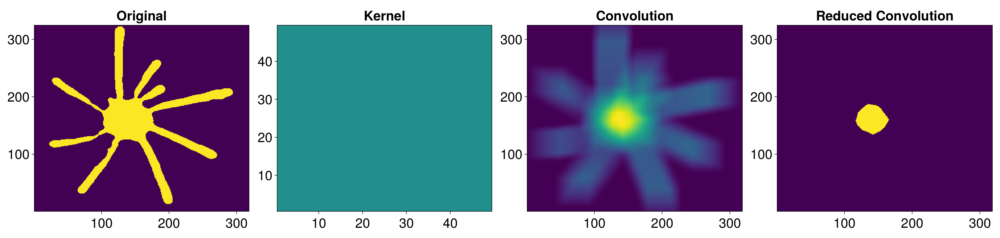

In [103]:
comp_conv = Figure(size = (2100,500))
ax_1 = CairoMakie.Axis(comp_conv[1,1], title = "Original")
heatmap!(ax_1, int_img)
ax_2 = CairoMakie.Axis(comp_conv[1,2], title = "Kernel")
heatmap!(ax_2, kernel)
ax_3 = CairoMakie.Axis(comp_conv[1,3], title = "Convolution")
heatmap!(ax_3, out)
ax_4 = CairoMakie.Axis(comp_conv[1,4], title = "Reduced Convolution")
heatmap!(ax_4, out.>para.threshold_conv)


save(joinpath(path,"show_cov.png"), comp_conv)
comp_conv